# Машинное обучение, DS-поток, осень 2022
## Задание 3.1


**Правила:**

* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds22_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. **Работы, присланные иным способом, не принимаются.**
* Дедлайны см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* В каждой задаче не забывайте делать **пояснения и выводы**.


**Правила оформления теоретических задач:**

* Решения необходимо прислать одним из следующих способов:
  * фотографией в правильной ориентации, где все четко видно, а почерк разборчив,
    * отправив ее как файл боту вместе с ноутбуком *или*
    * вставив ее в ноутбук посредством `Edit -> Insert Image` (<font color="red">фото, вставленные ссылкой, не принимаются</font>);
  * в виде $LaTeX$ в markdown-ячейках.
* Решения не проверяются, если какое-то требование не выполнено. Особенно внимательно все проверьте в случае выбора второго пункта (вставки фото в ноутбук). <font color="red"><b>Неправильно вставленные фотографии могут не передаться при отправке.</b></font> Для проверки попробуйте переместить `ipynb` в другую папку и открыть его там.
* В решениях поясняйте, чем вы пользуетесь, хотя бы кратко. Например, если пользуетесь независимостью, то достаточно подписи вида "*X и Y незав.*"
* Решение, в котором есть только ответ, и отсутствуют вычисления, оценивается в 0 баллов.

**Баллы за задание:**

* Задача 1 &mdash; 30 баллов;
* Задача 2 &mdash; 20 баллов;
* Задача 3 &mdash; 100 баллов.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(palette='Set2')

### Задача 1 

Докажите, что в методе k-means кластеры образуют выпуклые множества. Выполняется ли данное свойство для кластеров, определеяемых гауссовской смесью? Под кластером имеется в виду область пространства признаков.

### Задача 2 
Проведите свое исследование датасета из `data.txt` на кластеризацию изученными методами, реализованными в sklearn:

- k-means;
- DBSCAN;
- Иерархическая кластеризация.

Для каждого метода выше обоснуйте, почему выбранные вами гиперпараметры оптимальны, исходя из внутренней структуры данных. Если вы не можете применить какой-то из методов на этих данных, то обоснуйте, почему.

*Примечание.* Задача является небольшим упражнением и не предполагает большое исследование.

In [435]:
data = np.loadtxt('data.txt')

In [436]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_samples, silhouette_score
from scipy.cluster.hierarchy import dendrogram
from warnings import filterwarnings
import matplotlib
random_state = 1
sns.set(style='white', font_scale=1.5)

Посмотрим на исходные данные на графике.

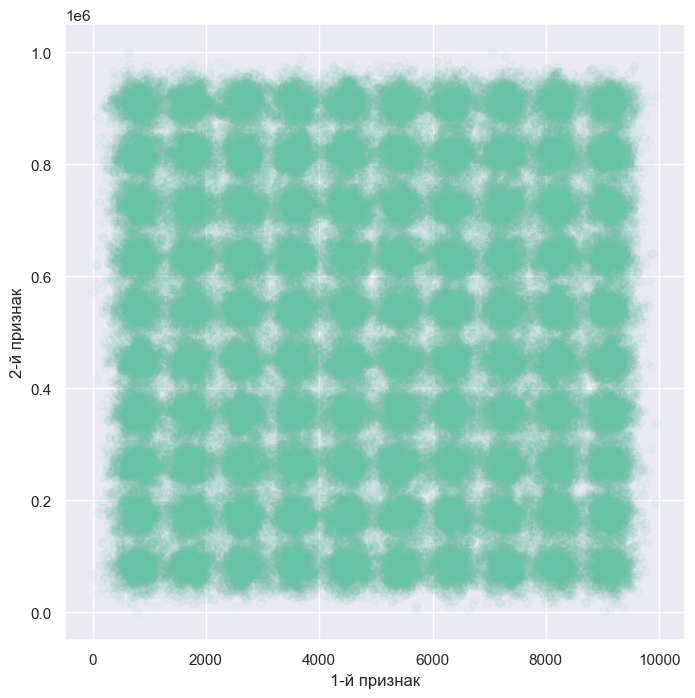

In [437]:
sns.set(palette='Set2')
fig = plt.figure(figsize=(8, 8))
plt.scatter(data[:, 0], data[:, 1], alpha=0.05)
plt.xlabel('1-й признак')
plt.ylabel('2-й признак');

Визуально можем увидеть разделение на 100 кластеров.

Проведем нормализацию исходных данных.

In [438]:
data = StandardScaler().fit_transform(data)

k-means

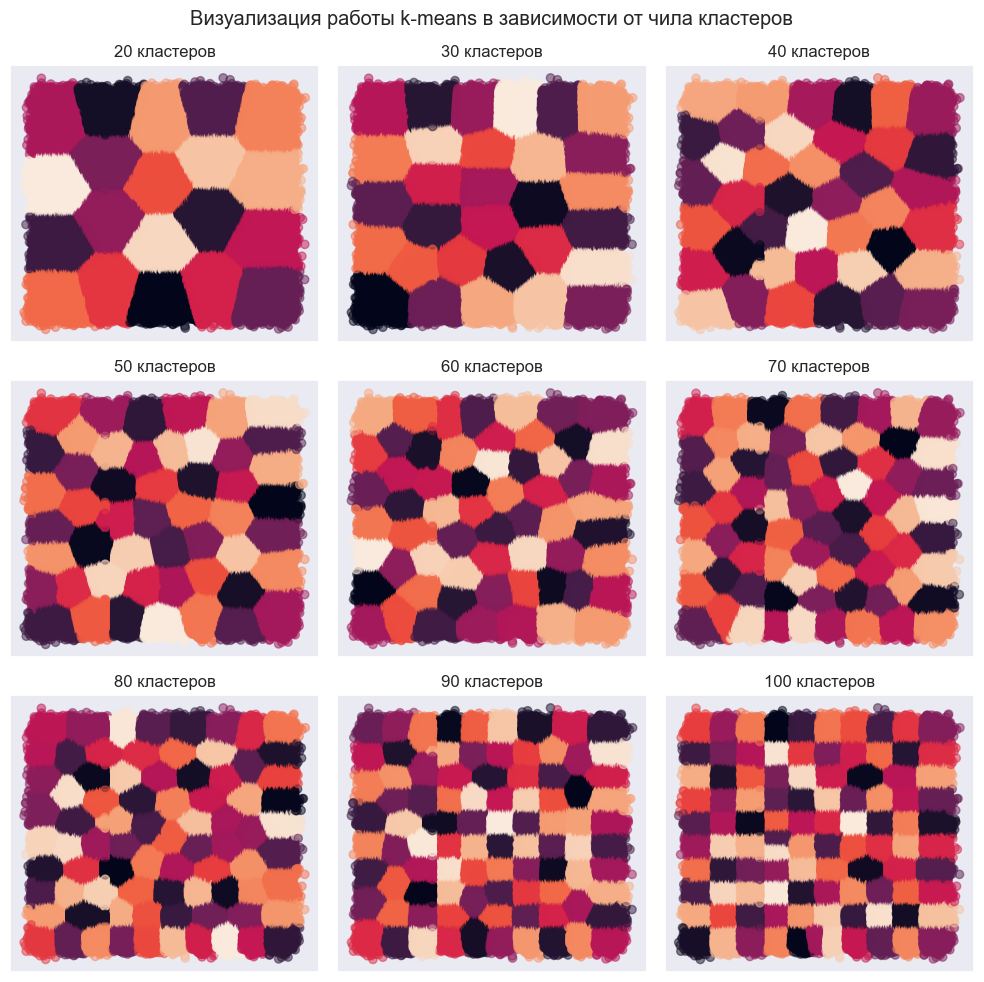

In [439]:
fig = plt.figure(figsize=(10, 10))

for n in range(2, 11):
    # Предсказание
    kmeans = KMeans(n_clusters=n * 10, random_state=random_state)
    kmeans.fit(data)
    y_pred = kmeans.predict(data)

    # Визуализация
    plt.subplot(3, 3, n - 1)
    plt.scatter(data[:, 0], data[:, 1], c=y_pred, alpha=0.5)
    plt.title(f'{n * 10} кластеров')
    plt.xticks([]), plt.yticks([])
    
fig.suptitle('Визуализация работы k-means в зависимости от чила кластеров')
plt.tight_layout();

Видно, что k-means кластеризует кластеры также, как и казалось визуально при просмотре всех данных.

DBSCAN

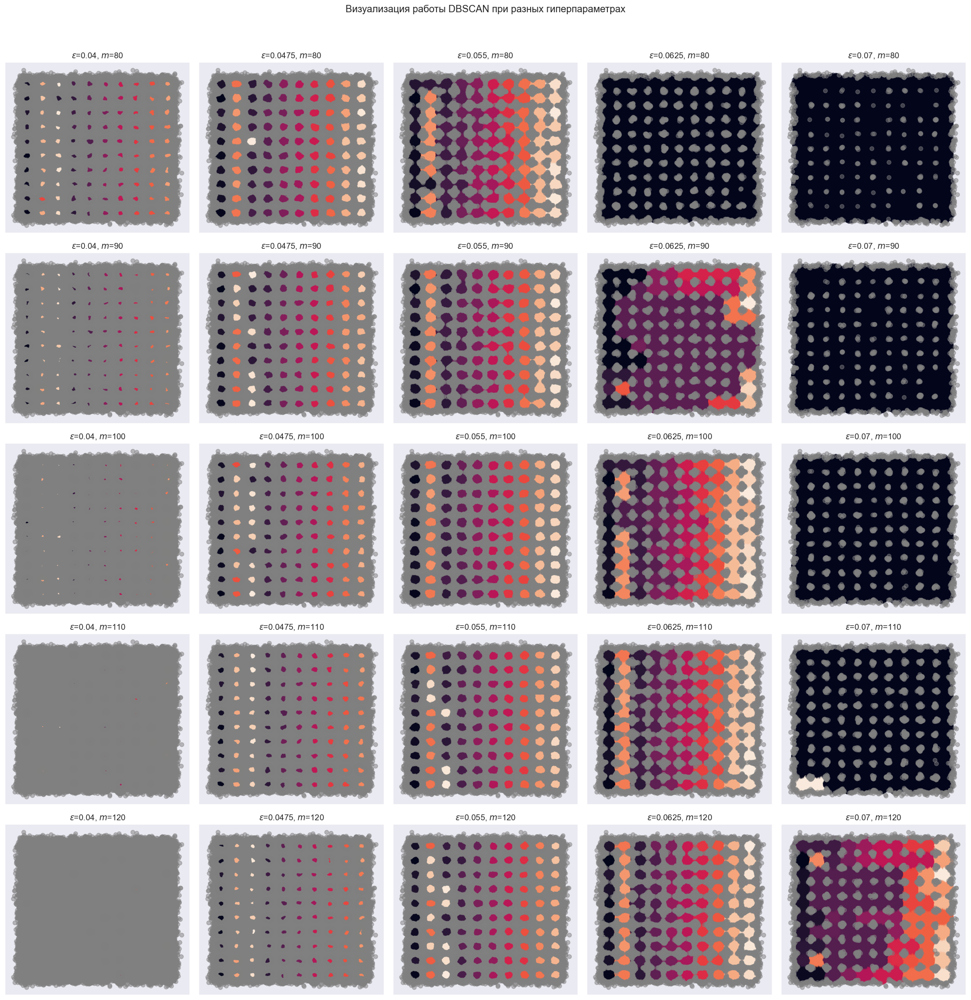

In [440]:
# Сетка параметров
eps, min_samples = np.meshgrid(
    np.linspace(0.04, 0.07, 5), np.arange(80, 130, 10))

fig = plt.figure(figsize=(20, 20))
for i in range(5):
    for j in range(5):
        
        # Применение метода
        dbscan = DBSCAN(eps=eps[i, j], min_samples=min_samples[i, j])
        y_pred = dbscan.fit_predict(data)
        outliers = (y_pred == -1)
        
        # Визуализация
        plt.subplot(5, 5, i * 5 + j + 1)
        plt.scatter(data[~outliers, 0], data[~outliers, 1], 
                    c=y_pred[~outliers], alpha=0.5)
        plt.scatter(data[outliers, 0], data[outliers, 1], 
                    c='gray', alpha=0.5)
        plt.title(
            f'$\\varepsilon$={np.round(eps[i, j], 4)}, $m$={min_samples[i, j]}')
        
        plt.xticks([]), plt.yticks([])
        
fig.suptitle('Визуализация работы DBSCAN при разных гиперпараметрах', y=1.02)
plt.tight_layout();

По графикам видно, что оптимальные значения гиперпараметров: $\varepsilon = 0.055$ и $m = 90 - 110$.

Иерархическую кластеризацию провести не удалось, тк недостаточно памяти (она занимает O($n^3$) памяти)

Вывод: с помощью методов k-means и DBSCAN получилось визуально хорошо кластеризовать наши данные.

### Задача 3
Скачайте <a href="https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis">данные</a> о клиентах некоторой торговой сети.

Цель задачи &mdash; кластеризовать клиентов с целью модификации продукта под разные типы пользовательских кластеров. Например, вместо того, чтобы тратиться на продвижение нового продукта каждому клиенту, можно продавать продукт только в том кластере, где клиенты с наибольшей вероятностью его купят.

In [491]:
data = pd.read_csv("./marketing_campaign.csv", sep="\t")
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


Посмотрим на признаки. Прочитайте также информацию о признаках на странице данных.

In [492]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

Посмотрим на диапазон дат регистрации

In [493]:
pd.to_datetime(data["Dt_Customer"], dayfirst=True).min(), 
pd.to_datetime(data["Dt_Customer"], dayfirst=True).max()

Timestamp('2014-06-29 00:00:00')

Кажется, данные выгружены в конце 2014 года, соответственно, определим дату анализа

In [494]:
end_date = pd.Timestamp('2015-01-01')
end_year = 2015

Посчитаем для каждого клиента количество дней с момента регистрации

In [495]:
data["Dt_Customer"] = pd.to_datetime(data["Dt_Customer"], dayfirst=True)
data["usage_time"] = (end_date - data["Dt_Customer"]) / pd.Timedelta('1 day')
data["usage_time"]

0       849.0
1       299.0
2       498.0
3       325.0
4       347.0
        ...  
2235    567.0
2236    205.0
2237    341.0
2238    342.0
2239    808.0
Name: usage_time, Length: 2240, dtype: float64

Создайте следующие признаки:
* возраст клиента на основе даты рождения
* сумма покупок по всем категориям
* общее количество детей, сложив `Kidhome` и `Teenhome`
* на основе количества детей и семейного положения (`Marital_Status`) определите *предполагаемый* размер семьи
* средние траты клиента в день в период пользования сервисом, поделив суммарные траты на количество дней от даты регистрации (*см. примечание далее*)

In [496]:
data['Client_Age'] = end_year - data['Year_Birth']

In [497]:
data['Amount_Buy'] = data.loc[:, 'MntFruits':'MntGoldProds'].sum(axis=1)

In [498]:
data['All_Child'] = data['Kidhome'] + data['Teenhome']

In [499]:
data.Marital_Status.unique() #посмотрим на всевозможные статусы и разделим их

array(['Single', 'Together', 'Married', 'Divorced', 'Widow', 'Alone',
       'Absurd', 'YOLO'], dtype=object)

In [500]:
two = ['Together', 'Married', 'YOLO']
data['Size_Family'] = np.array(list(map(lambda x: x in two, data['Marital_Status']))) + 1 + data['All_Child']
data['Size_Family']

0       1
1       3
2       2
3       3
4       3
       ..
2235    3
2236    5
2237    1
2238    3
2239    4
Name: Size_Family, Length: 2240, dtype: int64

*Примечание.* 

Клиент может перестать пользоваться сервисом спустя какое-то время, поэтому корректнее было бы делить на время пользования сервисом. В данных не сказано о том, в каких случаях клиента можно отнести в отток, а так же не указан принцип выгрузки данных (все клиенты или только активные), но имеется признак `Recency` &mdash; количество дней с момента последней покупки клиента. 

Исследуйте этот признак и попробуйте понять, можно ли из данных сделать вывод о том, какие типы клиентов присутствуют в данных, каких клиентов можно отнести в отток. Если это сделать удалось, то при вычислении средних трат клиента в день делить нужно на количество дней использования сервиса в случае, если клиент попал в отток. Если клиент активен, то мы считаем, что он до сих пор пользуется сервисом, даже если последнюю покупку он совершал несколько дней назад.

In [501]:
data['Recency'].min(), data['Recency'].max() # минимальное и максимальное количество дней с последней покупки

(0, 99)

Отнесем в отток клиентов, которые не делали покупки более 80 дней.

In [502]:
data['Average_Buy'] = list(map(lambda x: data['Amount_Buy'][x] / (data['usage_time'][x] - data['Recency'][x])
            if data['Recency'][x] > 80 else data['Amount_Buy'][x] / data['usage_time'][x], range(data.shape[0])))

Далее будем работать с признаками:
* возраст клиента
* предполагаемый размер семьи
* средние траты клиента в день
* `Income` &mdash; годовой доход клиента

Проведите графическое исследование признаков. При необходимости выполните предобработку, обосновав ее необходимость.

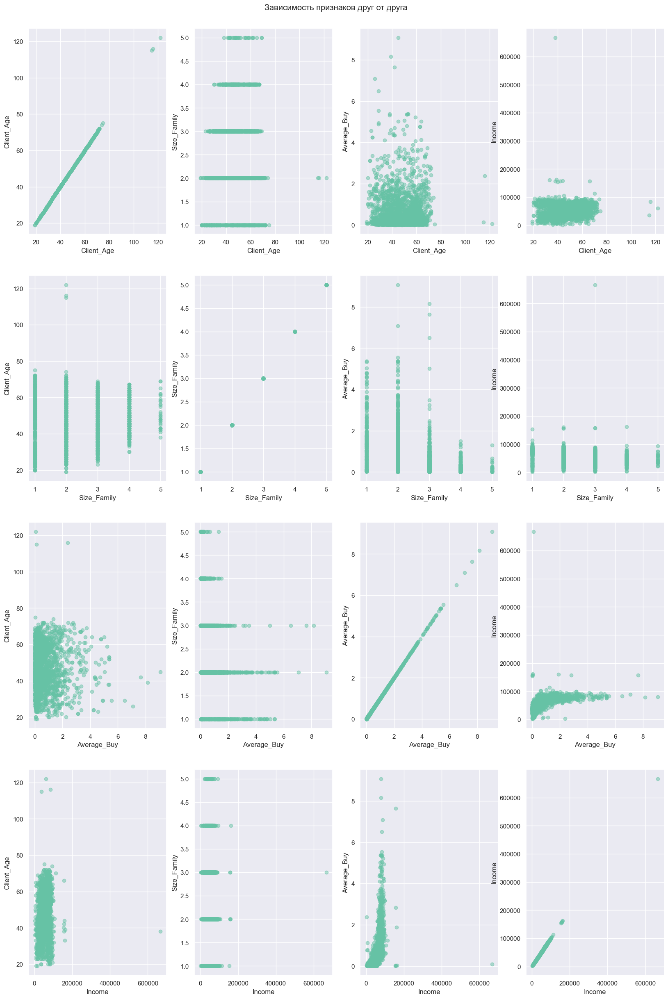

In [503]:
sns.set(palette='Set2')
plt.figure(figsize=(20, 30))
features = ['Client_Age', 'Size_Family', 'Average_Buy', 'Income']
coordinate = 1
for i in range(4):
    for j in range(4):
        plt.subplot(4, 4, coordinate)
        coordinate += 1
        plt.scatter(x=features[i], y=features[j], data=data, alpha=0.5)
        plt.xlabel(features[i])
        plt.ylabel(features[j])
plt.suptitle('Зависимость признаков друг от друга', y=0.9)
plt.show()

Видно, что на некоторых графиках присутствуют выбросы, удалим их.

In [504]:
data = data[(data['Client_Age'] <= 80) & (data['Average_Buy'] <= 4) & (data['Income'] <= 150000)]

Снова посмотрим на зависмость признаков друг от друга.

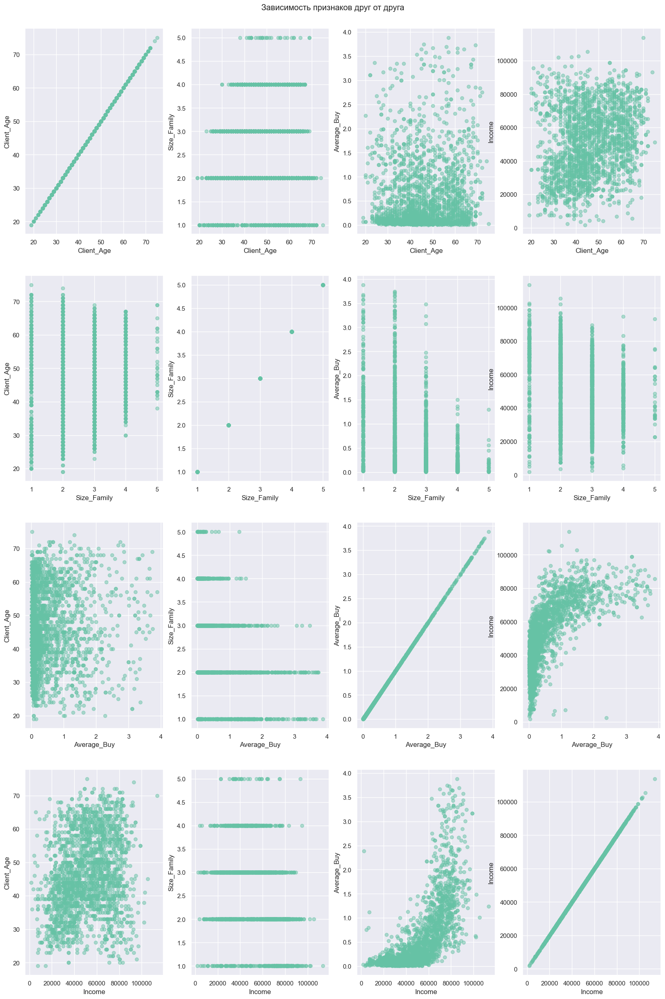

In [505]:
plt.figure(figsize=(20, 30))
features = ['Client_Age', 'Size_Family', 'Average_Buy', 'Income']
coordinate = 1
for i in range(4):
    for j in range(4):
        plt.subplot(4, 4, coordinate)
        coordinate += 1
        plt.scatter(x=features[i], y=features[j], data=data, alpha=0.5)
        plt.xlabel(features[i])
        plt.ylabel(features[j])
plt.suptitle('Зависимость признаков друг от друга', y=0.9)
plt.show()

Есть ли в полученных данных пропуски? Если да, то насколько много, можно ли их удалить?

In [506]:
print('Пропусков в возрасте:', data['Client_Age'].isna().sum())
print('пропусков в размере семьи:', data['Size_Family'].isna().sum())
print('Пропусков в средних тратах:', data['Average_Buy'].isna().sum())
print('Пропусков в годовом доходе:', data['Income'].isna().sum())

Пропусков в возрасте: 0
пропусков в размере семьи: 0
Пропусков в средних тратах: 0
Пропусков в годовом доходе: 0


Пропусков нет. Они могли удалиться вместе с выбросами.

Перейдем к кластеризации клиентов. Какой метод кластеризации будете использовать и почему? Как определить оптимальное количество кластеров или, в зависимости от метода, других гиперпараметров?

Будем пользоваться методом k-means. В предыдущих графиках видно, что некоторые визуально видимые кластеры сливаются, а в методе DBSCAN чуть чуть сливающиеся кластеры могут слиться в один. Также можно заметить разную плотность в данных, что является недостатком для метода DBSCAN. Также необходимо подбирать 2 гиперпараметра вместо 1 в k-means. Иерархический же метод довольно дорогостоящий, он чувствителен к шуму и выбросам и может получиться так, что анализ дендрограммы будет провести очень сложно.

Сначала нормализуем наши данные.

In [507]:
new_data = data[['Client_Age', 'Size_Family', 'Average_Buy', 'Income']]
new_data = pd.DataFrame(StandardScaler().fit_transform(new_data))
new_data.columns = ['Client_Age', 'Size_Family', 'Average_Buy', 'Income']

Для определения оптимального количества кластеров воспользуемся методом локтя.

Выполните кластеризацию этим методом и подберите оптимальное количество гиперпараметров.

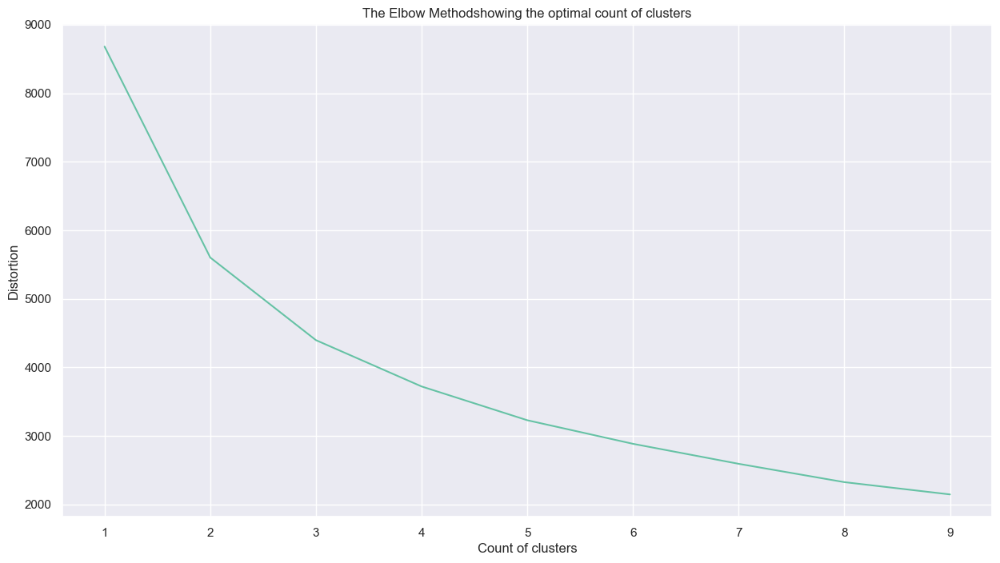

In [508]:
distortions = []
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=random_state)
    kmeans.fit(new_data)
    distortions.append(kmeans.inertia_)

plt.figure(figsize=(15,8))
plt.plot(range(1, 10), distortions)
plt.xlabel('Count of clusters')
plt.ylabel('Distortion')
plt.title('The Elbow Methodshowing the optimal count of clusters')
plt.show()

Видно, что оптимальное значение количества кластеров - 4 (тк там наблюдается "локоть").

Выполним кластеризацию с оптимальным гиперпараметром.

In [509]:
kmeans = KMeans(n_clusters=4, random_state=random_state)
kmeans.fit(new_data)
y_pred = kmeans.predict(new_data)

Сколько элементов в каждом из полученных кластеров?

Проинтерпретируйте полученные кластеры с помощью визуального анализа. Используйте различные типы графиков (например, box plot), изученные ранее. По каким признакам кластеры различаются, на сколько? Как можно описать клиентов каждого кластера?

Насколько кластеры соприкасаются друг с другом? Что можно сказать про клиентов на границе кластеров?

In [510]:
list(map(lambda x: list(y_pred).count(x), range(4))) # количетсво элементов в каждом кластере

[641, 404, 509, 616]

Видно, что количество элементов в каждом кластере не сильно отличается друг от друга.

Посмотрим на зависмость различных признаков друг от друга, учитывая кластеризацию.

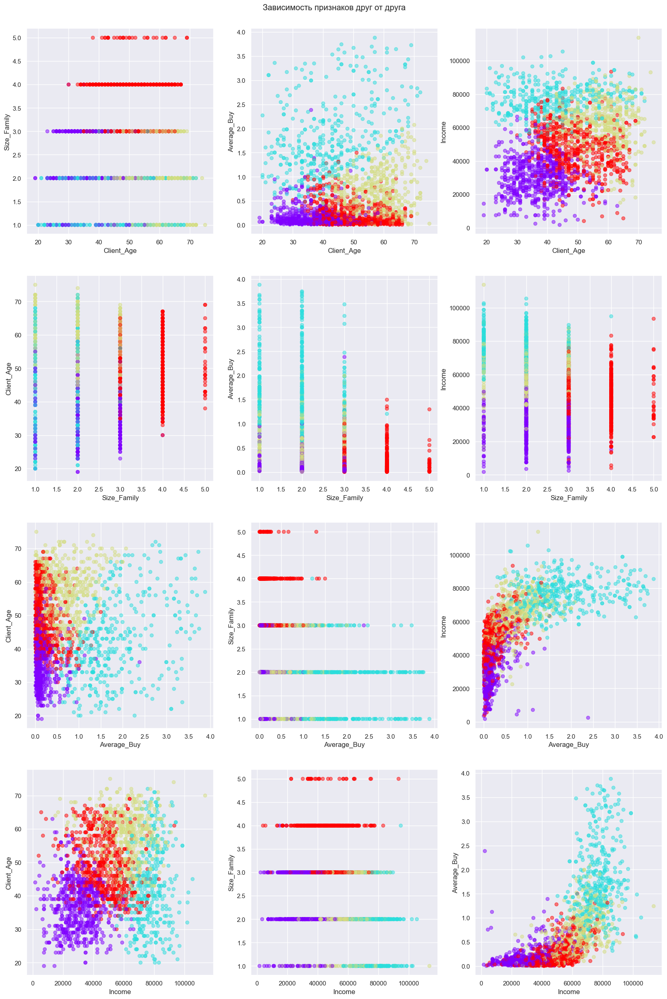

In [511]:
matplotlib.rcParams['image.cmap'] = 'rainbow'
plt.figure(figsize=(20, 30))
features = ['Client_Age', 'Size_Family', 'Average_Buy', 'Income']
coordinate = 1
for i in range(4):
    for j in range(4):
        if (i == j):
            continue
        plt.subplot(4, 3, coordinate)
        coordinate += 1
        plt.scatter(x=features[i], y=features[j], c=y_pred, data=data, alpha=0.5)
        plt.xlabel(features[i])
        plt.ylabel(features[j])
plt.suptitle('Зависимость признаков друг от друга', y=0.9);

Из некоторых графиков можно заметить различные зависимости. Например, данные хорошо кластеризованы на графике Average_Buy (Income), видно, что люди с большим доходом больше тратят и находятся в одном кластере и аналогично с меньшими доходами. То есть предлагать какие то дополнительные товары людям из фиолетового и красного кластеров не стоит, тк они зарабатывают мало и тратят мало, людям же из желтого кластера наоборот нужно предлагать товары, тк доход у них большой, но тратят они не так много, также можно, что-то предложить и людям из голубового кластера.  
Также данные хорошо кластеризованы на графике Client_Age (Income), там видно разделение людей на молодых и небогатых, молодых и богатых, взрослых и небогатых, взрослых и богатых.  
Неплохо кластеризовались и данные на графике Client_Age (Average_Buy).

In [512]:
silhouette_avg = silhouette_score(new_data, y_pred) # средний коэффициент силуэта по выборке
silhouette_avg

0.2565971240037564

Значение силуэта не равно 1, но при этом больше 0, поэтому с точки зрения метрики качества кластеризацию можно считать неплохой.

Попробуйте также применить другие изученные методы кластеризации. Насколько лучше или хуже получился результат?

Применим метод иерархической кластеризации. Сначала подберем оптимальное число кластеров. Для этого посчитаем средней коэффициент силуэта для нескольких значений количетсва кластеров и выберем тот, который будет ближе всего к 1.

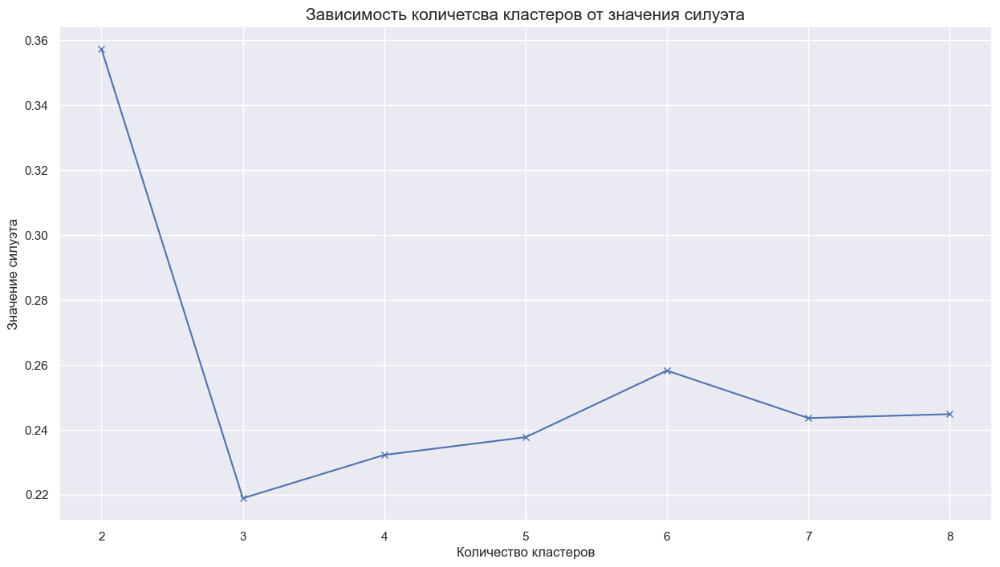

In [513]:
sns.set(palette='Set2')
silhouette_ans = []
for k in range(2, 9):
    agglomerat = AgglomerativeClustering(n_clusters=k)
    agglomerat.fit(new_data)
    silhouette_ans.append(silhouette_score(new_data, agglomerat.labels_))
plt.figure(figsize=(15,8))
plt.plot(range(2, 9), silhouette_ans, 'bx-')
plt.xlabel('Количество кластеров')
plt.ylabel('Значение силуэта')
plt.title('Зависимость количетсва кластеров от значения силуэта', fontsize=15);

Лучшее значение силуэта получается при количетсве кластеров равном 2.

In [514]:
agglomerat = AgglomerativeClustering(n_clusters=2)
agglomerat.fit(new_data)

children  = agglomerat.children_

# Расстояние от нижнего уровня до каждой нелистовой вершины 
# (только для визуализации дерева)
distance = np.arange(children.shape[0])

# Количество точек содержащееся в поддереве каждой нелистовой вершины.
n_dots = np.arange(2, children.shape[0] + 2)

linkage_matrix = np.column_stack([children, np.exp(distance / 50), n_dots]).astype(float)

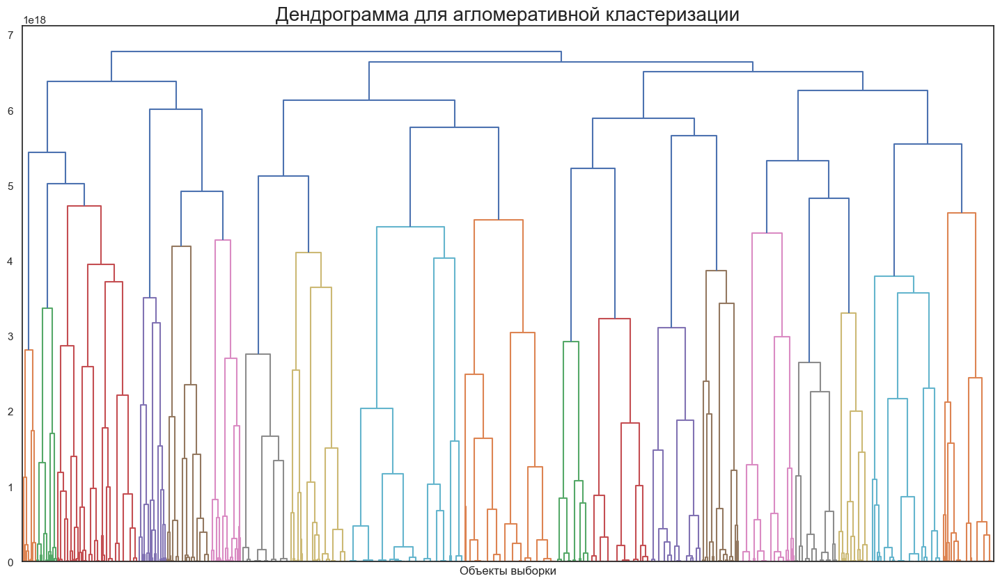

In [515]:
sns.set(style='white', font_scale=1)
plt.figure(figsize=(18, 10))
dendrogram(linkage_matrix, labels=agglomerat.labels_, no_labels=True)
plt.title('Дендрограмма для агломеративной кластеризации', fontsize=20)
plt.xlabel('Объекты выборки');

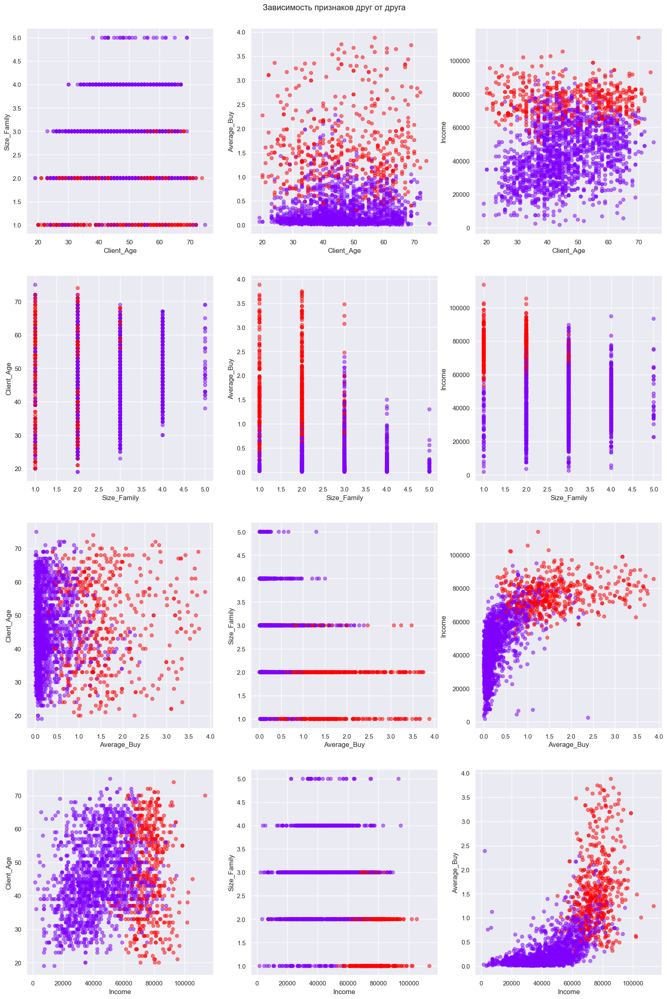

In [516]:
sns.set(palette='Set2')
matplotlib.rcParams['image.cmap'] = 'rainbow'
plt.figure(figsize=(20, 30))
features = ['Client_Age', 'Size_Family', 'Average_Buy', 'Income']
coordinate = 1
for i in range(4):
    for j in range(4):
        if (i == j):
            continue
        plt.subplot(4, 3, coordinate)
        coordinate += 1
        plt.scatter(x=features[i], y=features[j], c=agglomerat.labels_, data=data, alpha=0.5)
        plt.xlabel(features[i])
        plt.ylabel(features[j])
plt.suptitle('Зависимость признаков друг от друга', y=0.9);

Помимо графика Average_Buy (Income) кластеры разбились неинтерпретируемо, у них разная плотность и сложно выявить какую то зависмость между признаками. В графике же Average_Buy (Income) видно такое разделение: чем больше доход, тем больше средних трат, что логично (аналогичное разбиение было при применении k-means). Попробуем разбить данные на 4 кластера как в предыдущем методе.

In [517]:
agglomerat = AgglomerativeClustering(n_clusters=4)
agglomerat.fit(new_data)

children  = agglomerat.children_

# Расстояние от нижнего уровня до каждой нелистовой вершины 
# (только для визуализации дерева)
distance = np.arange(children.shape[0])

# Количество точек содержащееся в поддереве каждой нелистовой вершины.
n_dots = np.arange(2, children.shape[0] + 2)

linkage_matrix = np.column_stack([children, np.exp(distance / 50), n_dots]).astype(float)

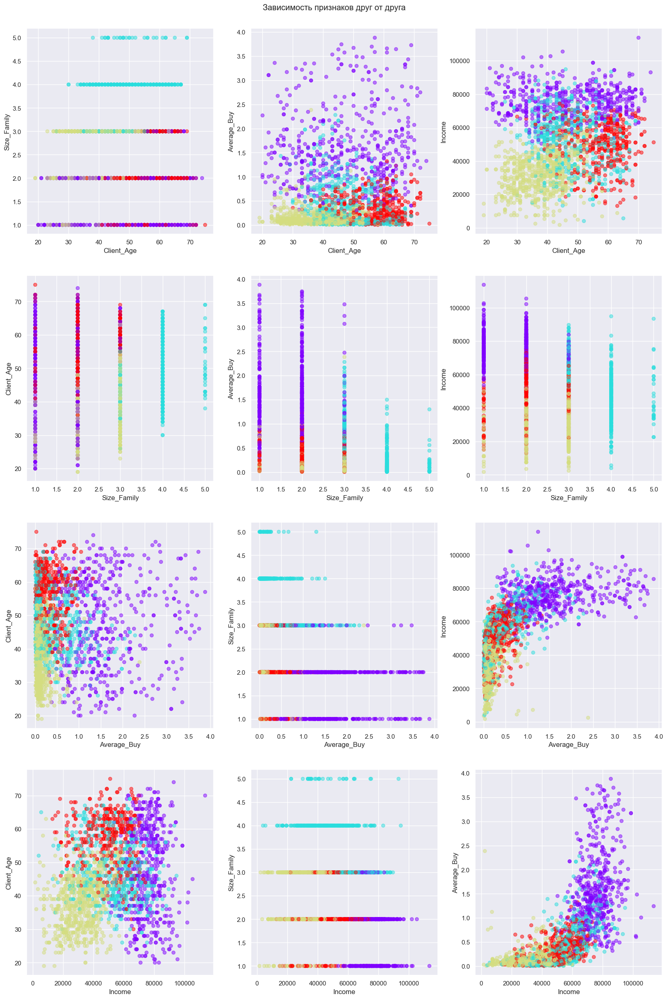

In [518]:
sns.set(palette='Set2')
matplotlib.rcParams['image.cmap'] = 'rainbow'
plt.figure(figsize=(20, 30))
features = ['Client_Age', 'Size_Family', 'Average_Buy', 'Income']
coordinate = 1
for i in range(4):
    for j in range(4):
        if (i == j):
            continue
        plt.subplot(4, 3, coordinate)
        coordinate += 1
        plt.scatter(x=features[i], y=features[j], c=agglomerat.labels_, data=data, alpha=0.5)
        plt.xlabel(features[i])
        plt.ylabel(features[j])
plt.suptitle('Зависимость признаков друг от друга', y=0.9);

In [519]:
silhouette_avg = silhouette_score(new_data, agglomerat.labels_) # средний коэффициент силуэта по выборке
silhouette_avg

0.23225204138528344

Данная кластеризация напоминает кластеризацию когда применяли k-means. Значение силуэта тоже похожее.

In [520]:
sns.set(palette='Set2')
from warnings import filterwarnings
import matplotlib
matplotlib.rcParams['image.cmap'] = 'rainbow'

Сейчас воспользуемся методом DBSCAN.

Я долго подбирал различные гиперпараметры, это было сложно из-за различной плотности в данных, и нашел значения, при которых данные хоть немного, но интерпретируемы.

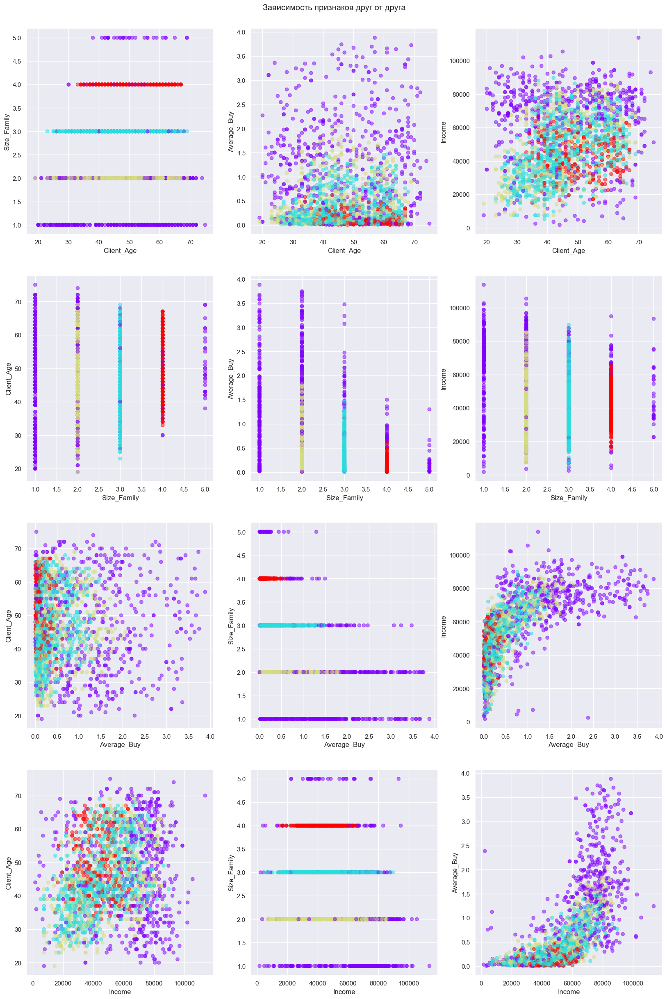

In [521]:
sns.set(palette='Set2')
matplotlib.rcParams['image.cmap'] = 'rainbow'

dbscan = DBSCAN(eps=0.5, min_samples=15)
y_pred = dbscan.fit_predict(new_data)

plt.figure(figsize=(20, 30))
features = ['Client_Age', 'Size_Family', 'Average_Buy', 'Income']
coordinate = 1
for i in range(4):
    for j in range(4):
        if (i == j):
            continue
        plt.subplot(4, 3, coordinate)
        coordinate += 1
        plt.scatter(x=features[i], y=features[j], c=y_pred, data=data, alpha=0.5)
        plt.xlabel(features[i])
        plt.ylabel(features[j])
plt.suptitle('Зависимость признаков друг от друга', y=0.9);

В отличии от предыдущих методов, на графиках видно, что хорошо кластеризовать данные не получилось, сложно найти какую-то зависмость между признаками.

In [522]:
np.unique(y_pred) # количество кластеров

array([-1,  0,  1,  2])

In [523]:
silhouette_avg = silhouette_score(new_data, y_pred) # средний коэффициент силуэта по выборке
silhouette_avg

0.09260645990422521

Значение силуэта получилось хуже, чем в k-means и Иерархическом методах, что также можно видеть на графиках зависимости.

Не забывайте про выводы.

Вывод: я применил 3 разных метода кластеризации для одних и тех же данных и получил, что k-means и Иерархический методы кластеризуют наши данные лучше, чем DBSCAN метод. При кластеризации k-means и Иерархическим методами можно увидеть зависмость между признаками у данных из разных кластеров и попытаться объяснить их. Данные методы разбили В DBSCAN методе же данные кластеризуются плохо, скорее всего это связано с разной плотностью данных и сливающимися кластерами, из-за чего и очень трудно подобрать оптимальные гиперпараметры. Средние значения силуэта также подтверждают вышесказанное: в k-means и Иерархическом методах его значение больше, чем в DBSCAN.